## Website Classification Using SVM

## Data Loading

In [1]:
## Importing dataset via kaggle

!kaggle datasets download -d hetulmehta/website-classification

Dataset URL: https://www.kaggle.com/datasets/hetulmehta/website-classification
License(s): CC0-1.0
100%|███████████████████████████████████████| 2.00M/2.00M [00:02<00:00, 840kB/s]
100%|███████████████████████████████████████| 2.00M/2.00M [00:02<00:00, 809kB/s]


In [2]:
# Exporting dataset from zipfile

import zipfile
zip_ref = zipfile.ZipFile('/home/bhxveshhh/ML/Website Classification/website-classification.zip', 'r')
zip_ref.extractall('/home/bhxveshhh/ML/Website Classification')
zip_ref.close()

## Exploratory Data Analysis

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')


In [46]:
df = pd.read_csv('website_classification.csv')

In [47]:
df.head()

,Unnamed: 0,website_url,cleaned_website_text,Category
0,0,https://www.booking.com/index.html?aid=1743217,official site good hotel accommodation big sav...,Travel
1,1,https://travelsites.com/expedia/,expedia hotel book sites like use vacation wor...,Travel
2,2,https://travelsites.com/tripadvisor/,tripadvisor hotel book sites like previously d...,Travel
3,3,https://www.momondo.in/?ispredir=true,cheap flights search compare flights momondo f...,Travel
4,4,https://www.ebookers.com/?AFFCID=EBOOKERS-UK.n...,bot create free account create free account si...,Travel


In [74]:
df['cleaned_website_text'].tolist()

['official site good hotel accommodation big saving hotel destination worldwide browse hotel review find guarantee good price hotel budget lodging accommodation hotel hotels special offer package special weekend break city break deal budget cheap discount saving select language find deal hotel home try search connect traveller india travel talk community recommend destination flamborough boreland colvend catfield harberton warleggan inspiration trip spot winter wildlife beautiful snowy island bye bye work want spontechnaity tech drive travel vital value maximise travel homes guest love browse property type hotels apartments resorts villa cabins cottage glamping serviced apartment holiday home guest house hostels motels ryokans riads holiday park homestays campsites country house farm stay boats luxury tent self catering accommodation tiny house chapel saint leonards wuqing wuchang saint eval great rowsley instow verified review real guest work start booking follow trip finally review s

In [48]:
df.shape

(1408, 4)

In [49]:
df.size

5632

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1408 entries, 0 to 1407
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Unnamed: 0            1408 non-null   int64 
 1   website_url           1408 non-null   object
 2   cleaned_website_text  1408 non-null   object
 3   Category              1408 non-null   object
dtypes: int64(1), object(3)
memory usage: 44.1+ KB


In [51]:
df.describe()

,Unnamed: 0
count,1408.000000
mean,703.500000
std,406.598901
min,0.000000
25%,351.750000
50%,703.500000
75%,1055.250000
max,1407.000000


In [52]:
df.isnull().sum()

Unnamed: 0              0
website_url             0
cleaned_website_text    0
Category                0
dtype: int64

In [53]:
df.duplicated().sum()

np.int64(0)

In [54]:
df.nunique()

Unnamed: 0              1408
website_url             1384
cleaned_website_text    1375
Category                  16
dtype: int64

In [55]:
unique_catergory = df['Category'].unique()
print(unique_catergory)

['Travel' 'Social Networking and Messaging' 'News' 'Streaming Services'
 'Sports' 'Photography' 'Law and Government' 'Health and Fitness' 'Games'
 'E-Commerce' 'Forums' 'Food' 'Education' 'Computers and Technology'
 'Business/Corporate' 'Adult']


## Data Visualization

In [78]:
# Creating a duplicate dataframe for data visualization

df_dv = df.copy()

In [ ]:
# Renaming the column name and labeling the Catergory

df_dv.rename(columns={'cleaned_website_text': 'Text', 'Category': 'Label'}, inplace=True)

df_dv['Label'] = df_dv['Label'].replace({
    0: 'Travel',
    1: 'Social Networking and Messaging',
    2: 'News',
    3: 'Streaming Services',
    4: 'Sports',
    5: 'Photography',
    6: 'Law and Government',
    7: 'Health and Fitness',
    8: 'Games',
    9: 'E-Commerce',
    10: 'Forums',
    11: 'Food',
    12: 'Education',
    13: 'Computers and Technology',
    14: 'Business/Corporate',
    15: 'Adult',
})

df_dv.drop('Unnamed: 0',axis=1,inplace=True)
df_dv.dropna(inplace=True)



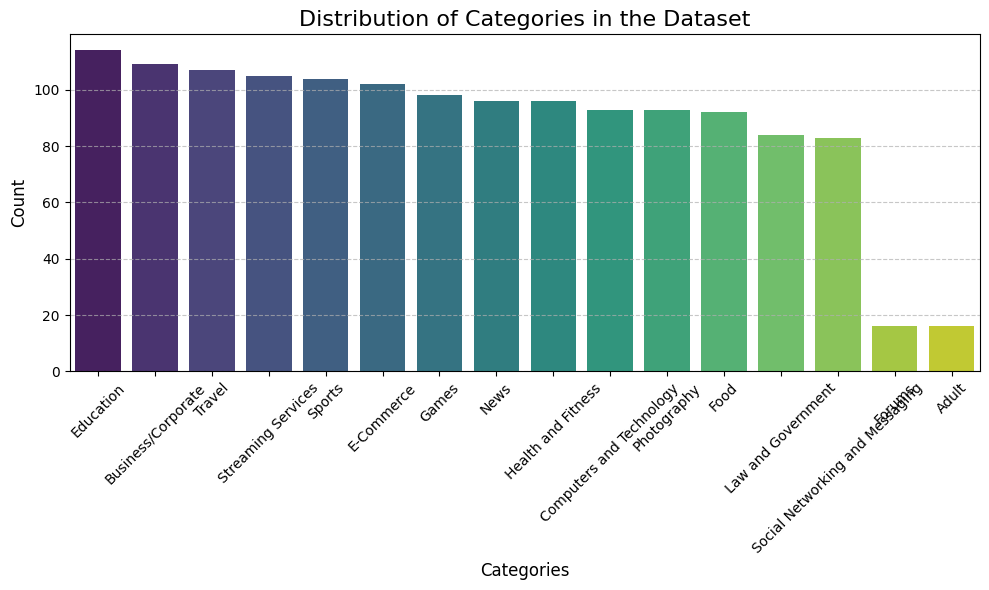

In [82]:
# Visualizing Distribution of Categories

label_counts = df_dv['Label'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
plt.title('Distribution of Categories in the Dataset', fontsize=16)
plt.xlabel('Categories', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

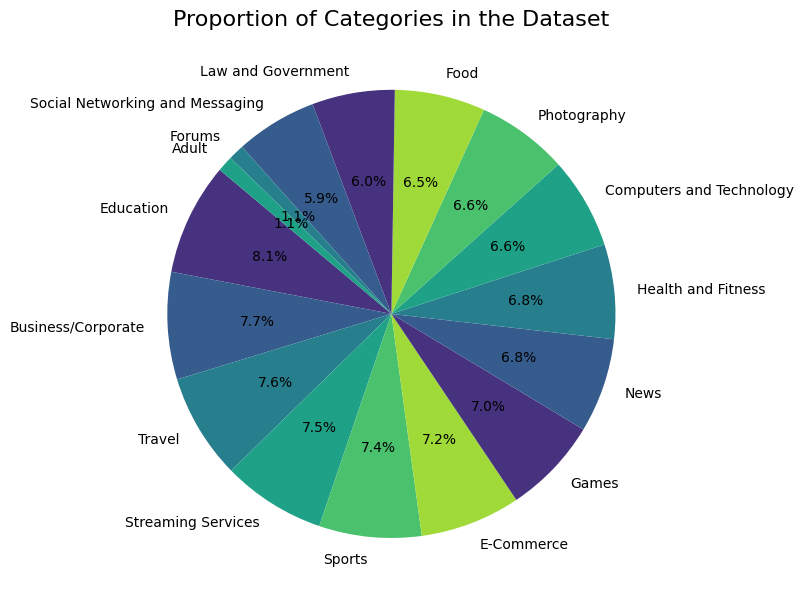

In [83]:
# Visualizing Categories Distribution

plt.figure(figsize=(8, 8))

df_dv['Label'].value_counts().plot.pie(autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis'))
plt.title('Proportion of Categories in the Dataset', fontsize=16)
plt.ylabel('')
plt.tight_layout()
plt.show()

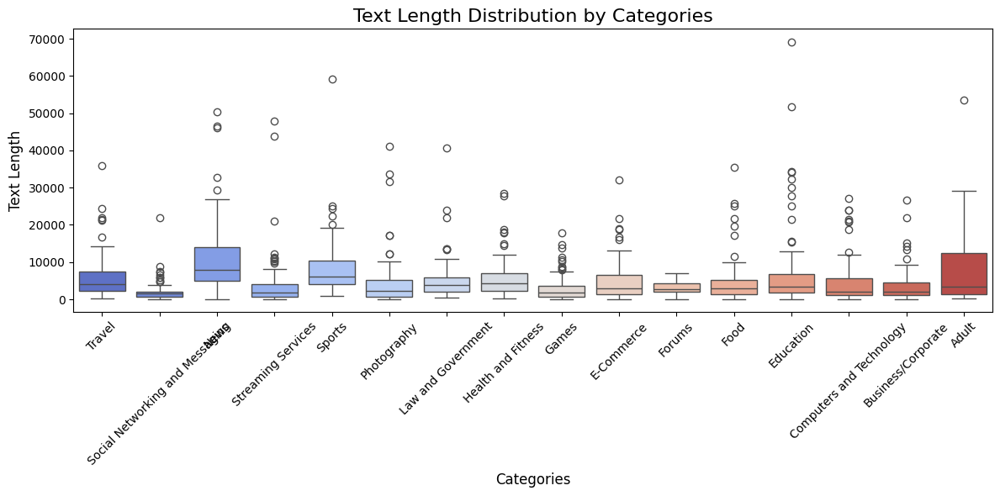

In [84]:
# Representing Text Length Distribution by Categories

df_dv['Text_Length'] = df_dv['Text'].apply(len)

plt.figure(figsize=(12, 6))
sns.boxplot(x='Label', y='Text_Length', data=df_dv, palette='coolwarm')
plt.title('Text Length Distribution by Categories', fontsize=16)
plt.xlabel('Categories', fontsize=12)
plt.ylabel('Text Length', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

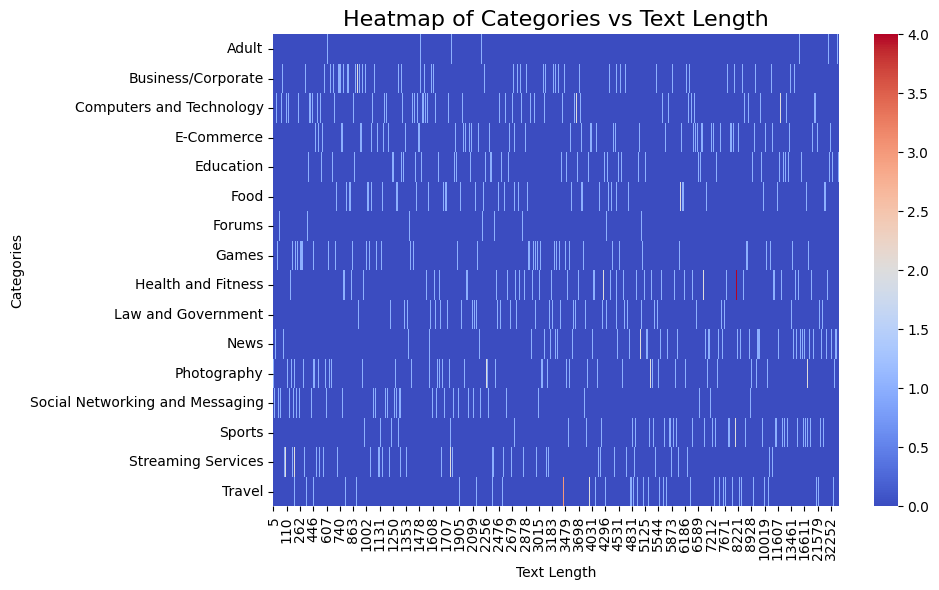

In [86]:
# Heatmap for Categories Correlation

catergory_pivot = pd.crosstab(df_dv['Label'], df_dv['Text_Length'])

plt.figure(figsize=(10, 6))
sns.heatmap(catergory_pivot, cmap='coolwarm', cbar=True)
plt.title('Heatmap of Categories vs Text Length', fontsize=16)
plt.xlabel('Text Length')
plt.ylabel('Categories')
plt.tight_layout()
plt.show()

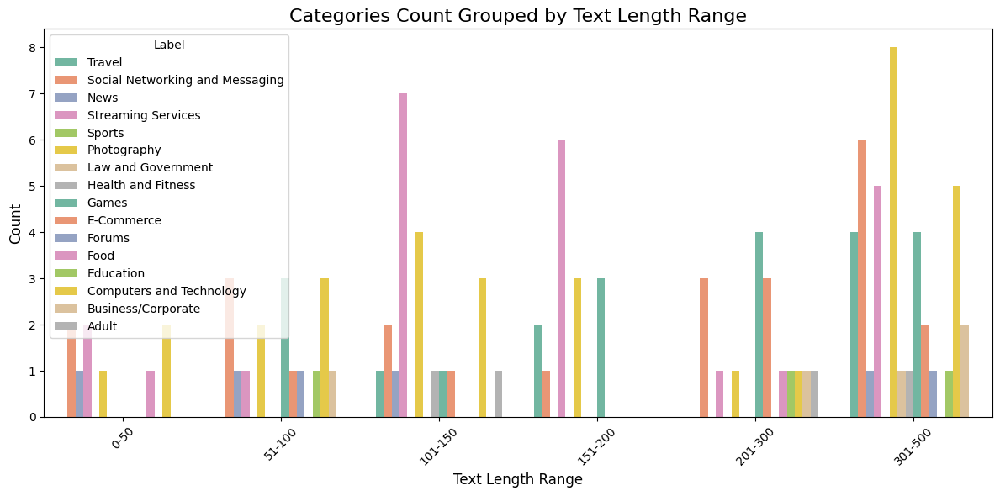

In [87]:
# Visualizing Categories Count Grouped by Text Length Range

df_dv['Length_Bin'] = pd.cut(df_dv['Text_Length'], bins=[0, 50, 100, 150, 200, 300, 500],
                          labels=['0-50', '51-100', '101-150', '151-200', '201-300', '301-500'])

plt.figure(figsize=(12, 6))
sns.countplot(x='Length_Bin', hue='Label', data=df_dv, palette='Set2')
plt.title('Categories Count Grouped by Text Length Range', fontsize=16)
plt.xlabel('Text Length Range', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [89]:
print(unique_catergory)

['Travel' 'Social Networking and Messaging' 'News' 'Streaming Services'
 'Sports' 'Photography' 'Law and Government' 'Health and Fitness' 'Games'
 'E-Commerce' 'Forums' 'Food' 'Education' 'Computers and Technology'
 'Business/Corporate' 'Adult']


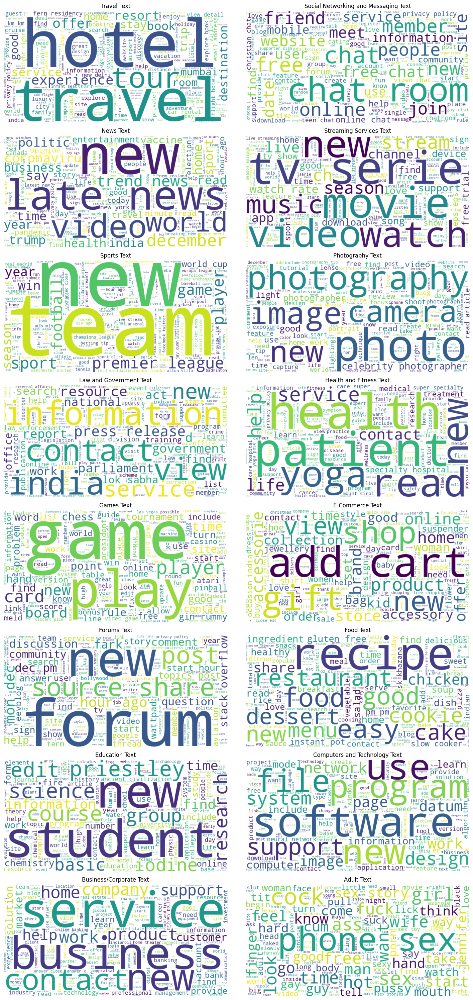

In [92]:
# Creating WordCloud for all the labels

from wordcloud import WordCloud

emotion_dfs = {
    'Travel': df_dv[df_dv['Label'] == 'Travel'],
    'Social Networking and Messaging': df_dv[df_dv['Label'] == 'Social Networking and Messaging'],
    'News': df_dv[df_dv['Label'] == 'News'],
    'Streaming Services': df_dv[df_dv['Label'] == 'Streaming Services'],
    'Sports': df_dv[df_dv['Label'] == 'Sports'],
    'Photography': df_dv[df_dv['Label'] == 'Photography'],
    'Law and Government': df_dv[df_dv['Label'] == 'Law and Government'],
    'Health and Fitness': df_dv[df_dv['Label'] == 'Health and Fitness'],
    'Games': df_dv[df_dv['Label'] == 'Games'],
    'E-Commerce': df_dv[df_dv['Label'] == 'E-Commerce'],
    'Forums': df_dv[df_dv['Label'] == 'Forums'],
    'Food': df_dv[df_dv['Label'] == 'Food'],
    'Education': df_dv[df_dv['Label'] == 'Education'],
    'Computers and Technology': df_dv[df_dv['Label'] == 'Computers and Technology'],
    'Business/Corporate': df_dv[df_dv['Label'] == 'Business/Corporate'],
    'Adult': df_dv[df_dv['Label'] == 'Adult'],
}

plt.figure(figsize=(15, 30))
for i, (emotion, subset) in enumerate(emotion_dfs.items(), 1):
    if not subset.empty:
        combined_text = ' '.join(subset['Text'])
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)

        plt.subplot(8, 2, i)
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'{emotion} Text')
        plt.axis('off')

plt.tight_layout()
plt.show()

## Data Preprocessing

In [56]:
# Dropping unwanted columns

df.drop(columns=['Unnamed: 0','website_url'])

,cleaned_website_text,Category
0,official site good hotel accommodation big sav...,Travel
1,expedia hotel book sites like use vacation wor...,Travel
2,tripadvisor hotel book sites like previously d...,Travel
3,cheap flights search compare flights momondo f...,Travel
4,bot create free account create free account si...,Travel
...,...,...
1403,old nude women porn mature granny sex horny ol...,Adult
1404,bdsm cams bdsm chat bondage cams free bdsm vid...,Adult
1405,porno dvd online european porn dvd cheap adult...,Adult
1406,anal dream house anal dream house anal dream h...,Adult


In [57]:
X = df.drop('Category', axis=1)
y = df['Category']

In [58]:
# Label Encoding category column

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y = le.fit_transform(y)

In [59]:
## Train Test Split

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

## Model Building

In [61]:
# Creating Classifier pipeline

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC


text_clf = Pipeline([('tfidf', TfidfVectorizer()), ('clf', LinearSVC())])
text_clf.fit(X_train['cleaned_website_text'], y_train)

Pipeline(steps=[('tfidf', TfidfVectorizer()), ('clf', LinearSVC())])

In [62]:
pred = text_clf.predict(X_test)

## Model Evaluation

In [65]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

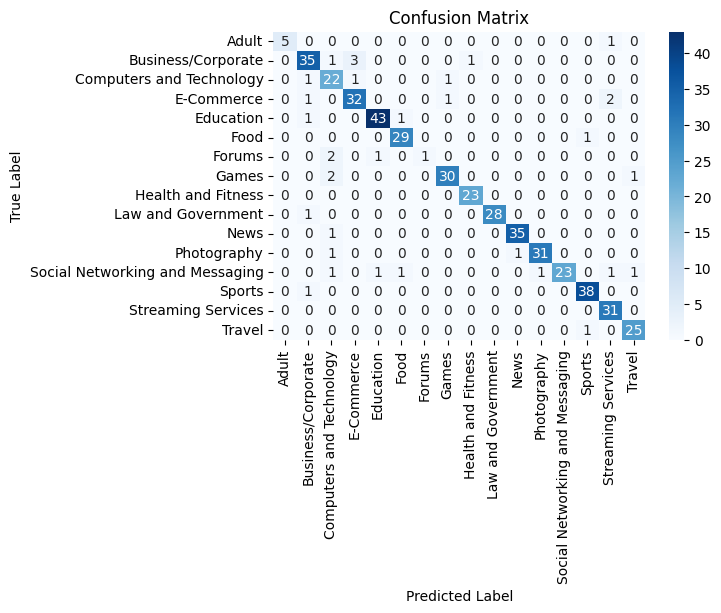

In [ ]:
# Plot the confusion matrix

pred = text_clf.predict(X_test['cleaned_website_text'])

cm = confusion_matrix(y_test, pred)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# Classification Report

report = classification_report(y_test, pred, output_dict=True)
df_report = pd.DataFrame(report).transpose()

print(df_report)

              precision    recall  f1-score     support
0              1.000000  0.833333  0.909091    6.000000
1              0.875000  0.875000  0.875000   40.000000
2              0.733333  0.880000  0.800000   25.000000
3              0.888889  0.888889  0.888889   36.000000
4              0.955556  0.955556  0.955556   45.000000
5              0.935484  0.966667  0.950820   30.000000
6              1.000000  0.250000  0.400000    4.000000
7              0.937500  0.909091  0.923077   33.000000
8              0.958333  1.000000  0.978723   23.000000
9              1.000000  0.965517  0.982456   29.000000
10             0.972222  0.972222  0.972222   36.000000
11             0.968750  0.939394  0.953846   33.000000
12             1.000000  0.793103  0.884615   29.000000
13             0.950000  0.974359  0.962025   39.000000
14             0.885714  1.000000  0.939394   31.000000
15             0.925926  0.961538  0.943396   26.000000
accuracy       0.926882  0.926882  0.926882    0